## Data Preprocessing, Preparation and Model Implementation

In [ ]:
import numpy as np
import pandas as pd
import os
import random
import cv2
import matplotlib.pyplot as plt
#import spell_corrector as sc
import math
from PIL import Image, ImageDraw
from PIL import ImagePath
import pandas as pd
import os
from os import path
from tqdm import tqdm
import json
import pathlib
import urllib
import glob
import re
import tensorflow as tf
import csv
import sys
import cv2
import time
import argparse
import itertools
from multiprocessing import Pool
import threading
import numpy as np
import scipy.optimize
import matplotlib.pyplot as plt
import matplotlib.patches as Patches
from shapely.geometry import Polygon

import tensorflow as tf

from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession

config = ConfigProto()
config.gpu_options.allow_growth = True
session = InteractiveSession(config=config)
import warnings
warnings.filterwarnings("ignore")

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
cd /content/drive/MyDrive/Case Study 2

/content/drive/MyDrive/Case Study 2


In [ ]:
df_train = pd.read_pickle("df_train.pkl")
df_test = pd.read_pickle("df_test.pkl")

In [ ]:
df_train.head()

# 1. Methods for text detection & recognition before the Deep Learning Era

### 1.1 MSER(Maximally Stable Extremal Regions)

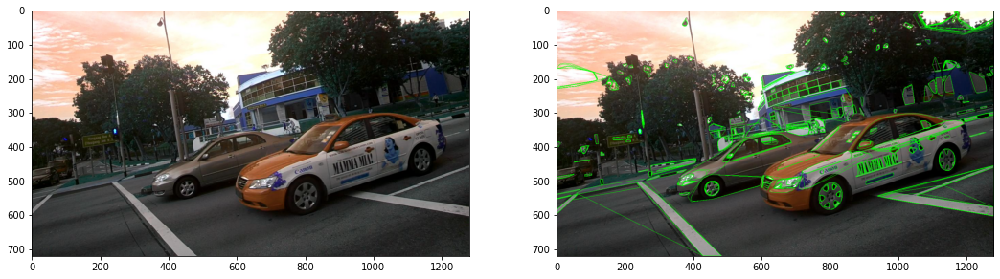

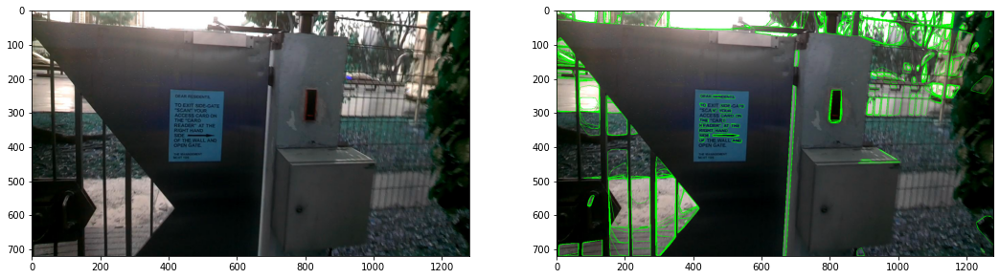

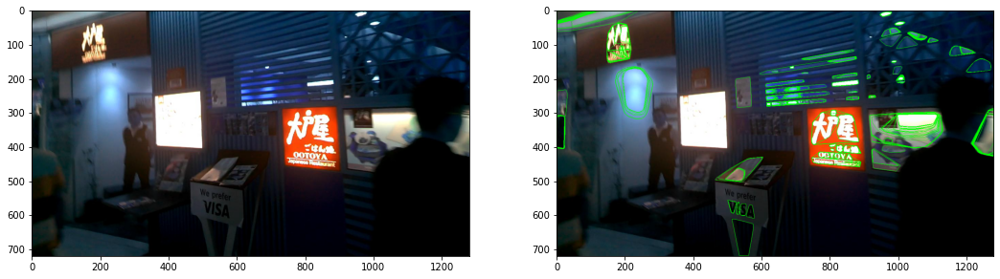

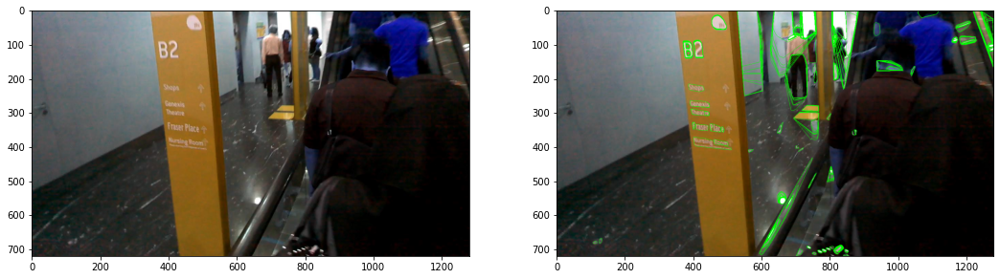

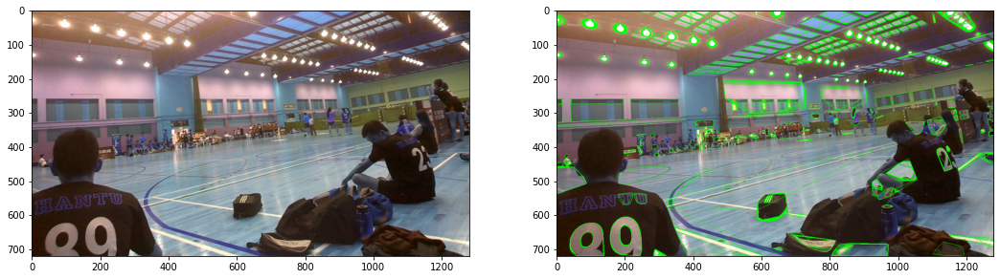

In [ ]:
#Create MSER object

for i in range(10,15):

  filepath = df_train['path_img'][i]

  img_array = cv2.imread(filepath)

  plt.figure(figsize=(18,8))
  plt.subplot(1,2,1)
  plt.grid(False)   
  plt.imshow(img_array)

  plt.subplot(1,2,2)
  mser = cv2.MSER_create()

  #Reading image
  img = cv2.imread(df_train['path_img'].values[i])

  #Convert to gray scale
  gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

  #Detect regions in gray scale image
  regions, _ = mser.detectRegions(gray)

  #Hulls for each dtected regions
  hulls = [cv2.convexHull(p.reshape(-1, 1, 2)) for p in regions]

  #Drawing polylines on image
  cv2.polylines(img, hulls, 1, (0, 255, 0))

  #Showing image with polylines on detected text in an image
  plt.grid(False)
  plt.imshow(img)

##1.2 SWT(Stroke Width Transform)

In [ ]:
#https://stackoverflow.com/questions/11116199/stroke-width-transform-swt-implementation-python
from swtloc import SWTLocalizer
from swtloc.utils import imgshowN, imgshow

swtl = SWTLocalizer()
imgpaths = ... # Image paths, can be one image or more than one
swtl.swttransform(imgpaths=df_train['path_img'][13], save_results=True, save_rootpath='swtres/',
                  edge_func = 'ac', ac_sigma = 1.0, text_mode = 'db_lf',
                  gs_blurr=True, blurr_kernel = (5,5), minrsw = 3, 
                  maxCC_comppx = 10000, maxrsw = 200, max_angledev = np.pi/6, 
                  acceptCC_aspectratio = 5.0)

MainProcess @  |                COMPLETE                 | -> STATUS: 0.0% 1/1 Images Done. Transformations Complete



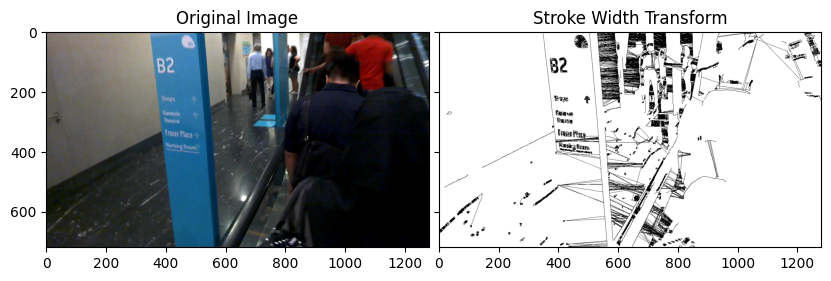

In [ ]:
imgshowN([swtl.orig_img, swtl.swt_mat], ['Original Image', 'Stroke Width Transform'])

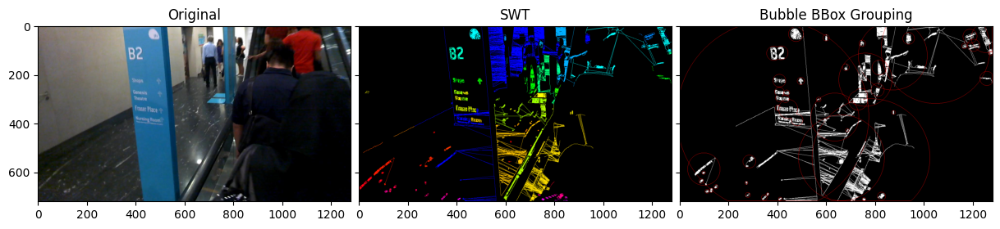

In [ ]:
respacket = swtl.get_grouped(lookup_radii_multiplier=1, sw_ratio=2,
                             cl_deviat=[13,13,13], ht_ratio=2, 
                             ar_ratio=3, ang_deviat=30)

grouped_labels = respacket[0]
grouped_bubblebbox = respacket[1]
grouped_annot_bubble = respacket[2]
grouped_annot = respacket[3]
maskviz = respacket[4]
maskcomb  = respacket[5]

imgshowN([swtl.orig_img, swtl.swt_labelled3C, grouped_annot_bubble],
         ['Original', 'SWT','Bubble BBox Grouping'],figsize=(15,8))

In [ ]:
listFiles = list(df_train['path_img'])

In [ ]:
#vocabulary creation
l=list(df_train['path_gt'])
CLASSES=[]
for i in tqdm(l):
    file=open(i)
    for line in file:
        line=line.replace('\n','')
        a=line.split(",")[-1]
        if a!='':
            CLASSES.append(a)
NUM_CLASSES=len(list(set(CLASSES)))      

100%|██████████| 1000/1000 [05:41<00:00,  2.93it/s]


In [ ]:
NUM_CLASSES

2683

In [ ]:
def load_annoataion(p):
    '''
    load polygon coordinate and text from the text file for corresponding image
    here p is name of image file whose cooresponding annotation we want 
    '''
    text_polys = []
    text_tags = []
    if not os.path.exists(p):
        return np.array(text_polys, dtype=np.float32), np.array(text_tags, dtype=np.int32)
    with open(p, 'r') as f:
        reader = csv.reader(f)
        for line in reader:
            label = line[-1].replace(' ','')
            line = [i.strip('\ufeff').strip('\xef\xbb\xbf') for i in line]

            x1, y1, x2, y2, x3, y3, x4, y4 = list(map(float, line[:8]))
            text_polys.append([[x1, y1], [x2, y2], [x3, y3], [x4, y4]])
            
            if label == '###':
                text_tags.append(None)
            else:
                text_tags.append(label)

        return np.array(text_polys, dtype=np.float32), text_tags   

In [ ]:
def polygon_area(poly):
    '''
    compute area of a polygon
    '''
    edge = [
        (poly[1][0] - poly[0][0]) * (poly[1][1] + poly[0][1]),
        (poly[2][0] - poly[1][0]) * (poly[2][1] + poly[1][1]),
        (poly[3][0] - poly[2][0]) * (poly[3][1] + poly[2][1]),
        (poly[0][0] - poly[3][0]) * (poly[0][1] + poly[3][1])
    ]
    return np.sum(edge)/2.

In [ ]:


def check_and_validate_polys(polys, tags, xxx_todo_changeme):
  '''
  check so that the text poly is in the same direction,
  and also filter some invalid polygons
  :param polys:
  :param tags:
  :return:
  '''
  (h, w) = xxx_todo_changeme
  if polys.shape[0] == 0:
    return polys
  polys[:, :, 0] = np.clip(polys[:, :, 0], 0, w-1)
  polys[:, :, 1] = np.clip(polys[:, :, 1], 0, h-1)

  validated_polys = []
  validated_tags = []
  for poly, tag in zip(polys, tags):
    p_area = polygon_area(poly)
    if abs(p_area) < 1:
      print('invalid poly')
      continue
    if p_area > 0:
      #if not FLAGS.suppress_warnings_and_error_messages:
      print('poly in wrong direction')
      poly = poly[(0, 3, 2, 1), :]
    validated_polys.append(poly)
    validated_tags.append(tag)
  return np.array(validated_polys), validated_tags


In [ ]:
#This function is implementation of Polygon Shrinkage Algorithm 

def shrink_poly(poly, r):
    '''
    fit a poly inside the origin poly
    used for generate the score map
    '''
    # shrink ratio
    R = 0.3
    # find the longer pair
    if np.linalg.norm(poly[0] - poly[1]) + np.linalg.norm(poly[2] - poly[3]) > \
                    np.linalg.norm(poly[0] - poly[3]) + np.linalg.norm(poly[1] - poly[2]):
        # first move (p0, p1), (p2, p3), then (p0, p3), (p1, p2)
        ## p0, p1
        theta = np.arctan2((poly[1][1] - poly[0][1]), (poly[1][0] - poly[0][0]))
        poly[0][0] += R * r[0] * np.cos(theta)
        poly[0][1] += R * r[0] * np.sin(theta)
        poly[1][0] -= R * r[1] * np.cos(theta)
        poly[1][1] -= R * r[1] * np.sin(theta)
        ## p2, p3
        theta = np.arctan2((poly[2][1] - poly[3][1]), (poly[2][0] - poly[3][0]))
        poly[3][0] += R * r[3] * np.cos(theta)
        poly[3][1] += R * r[3] * np.sin(theta)
        poly[2][0] -= R * r[2] * np.cos(theta)
        poly[2][1] -= R * r[2] * np.sin(theta)
        ## p0, p3
        theta = np.arctan2((poly[3][0] - poly[0][0]), (poly[3][1] - poly[0][1]))
        poly[0][0] += R * r[0] * np.sin(theta)
        poly[0][1] += R * r[0] * np.cos(theta)
        poly[3][0] -= R * r[3] * np.sin(theta)
        poly[3][1] -= R * r[3] * np.cos(theta)
        ## p1, p2
        theta = np.arctan2((poly[2][0] - poly[1][0]), (poly[2][1] - poly[1][1]))
        poly[1][0] += R * r[1] * np.sin(theta)
        poly[1][1] += R * r[1] * np.cos(theta)
        poly[2][0] -= R * r[2] * np.sin(theta)
        poly[2][1] -= R * r[2] * np.cos(theta)
    else:
        ## p0, p3
        # print poly
        theta = np.arctan2((poly[3][0] - poly[0][0]), (poly[3][1] - poly[0][1]))
        poly[0][0] += R * r[0] * np.sin(theta)
        poly[0][1] += R * r[0] * np.cos(theta)
        poly[3][0] -= R * r[3] * np.sin(theta)
        poly[3][1] -= R * r[3] * np.cos(theta)
        ## p1, p2
        theta = np.arctan2((poly[2][0] - poly[1][0]), (poly[2][1] - poly[1][1]))
        poly[1][0] += R * r[1] * np.sin(theta)
        poly[1][1] += R * r[1] * np.cos(theta)
        poly[2][0] -= R * r[2] * np.sin(theta)
        poly[2][1] -= R * r[2] * np.cos(theta)
        ## p0, p1
        theta = np.arctan2((poly[1][1] - poly[0][1]), (poly[1][0] - poly[0][0]))
        poly[0][0] += R * r[0] * np.cos(theta)
        poly[0][1] += R * r[0] * np.sin(theta)
        poly[1][0] -= R * r[1] * np.cos(theta)
        poly[1][1] -= R * r[1] * np.sin(theta)
        ## p2, p3
        theta = np.arctan2((poly[2][1] - poly[3][1]), (poly[2][0] - poly[3][0]))
        poly[3][0] += R * r[3] * np.cos(theta)
        poly[3][1] += R * r[3] * np.sin(theta)
        poly[2][0] -= R * r[2] * np.cos(theta)
        poly[2][1] -= R * r[2] * np.sin(theta)
    return poly


    


In [ ]:
def point_dist_to_line(p1, p2, p3):
    '''compute the distance from p3 to p1-p2'''
    return np.linalg.norm(np.cross(p2 - p1, p1 - p3)) / np.linalg.norm(p2 - p1)

#Find equation of line using two 2D points p1 and p2
def fit_line(p1, p2):
    '''fit a line ax+by+c = 0'''
    if p1[0] == p1[1]:
        return [1., 0., -p1[0]]
    else:
        [k, b] = np.polyfit(p1, p2, deg=1)
        return [k, -1., b]

In [ ]:
#Find Intersection poitn of 2 lines
def line_cross_point(line1, line2):
    '''line1 0= ax+by+c, compute the cross point of line1 and line2'''
    if line1[0] != 0 and line1[0] == line2[0]:
        print('Cross point does not exist')
        return None
    if line1[0] == 0 and line2[0] == 0:
        print('Cross point does not exist')
        return None
    if line1[1] == 0:
        x = -line1[2]
        y = line2[0] * x + line2[2]
    elif line2[1] == 0:
        x = -line2[2]
        y = line1[0] * x + line1[2]
    else:
        k1, _, b1 = line1
        k2, _, b2 = line2
        x = -(b1-b2)/(k1-k2)
        y = k1*x + b1
    return np.array([x, y], dtype=np.float32)

In [ ]:
def line_verticle(line, point):
    '''get the verticle line from line across point'''
    if line[1] == 0:
        verticle = [0, -1, point[1]]
    else:
        if line[0] == 0:
            verticle = [1, 0, -point[0]]
        else:
            verticle = [-1./line[0], -1, point[1] - (-1/line[0] * point[0])]
    return verticle

In [ ]:
def rectangle_from_parallelogram(poly):
    '''
    fit a rectangle from a parallelogram
    '''
    p0, p1, p2, p3 = poly
    angle_p0 = np.arccos(np.dot(p1-p0, p3-p0)/(np.linalg.norm(p0-p1) * np.linalg.norm(p3-p0)))
    if angle_p0 < 0.5 * np.pi:
        if np.linalg.norm(p0 - p1) > np.linalg.norm(p0-p3):
            # p0 and p2
            ## p0
            p2p3 = fit_line([p2[0], p3[0]], [p2[1], p3[1]])
            p2p3_verticle = line_verticle(p2p3, p0)

            new_p3 = line_cross_point(p2p3, p2p3_verticle)
            ## p2
            p0p1 = fit_line([p0[0], p1[0]], [p0[1], p1[1]])
            p0p1_verticle = line_verticle(p0p1, p2)

            new_p1 = line_cross_point(p0p1, p0p1_verticle)
            return np.array([p0, new_p1, p2, new_p3], dtype=np.float32)
        else:
            p1p2 = fit_line([p1[0], p2[0]], [p1[1], p2[1]])
            p1p2_verticle = line_verticle(p1p2, p0)

            new_p1 = line_cross_point(p1p2, p1p2_verticle)
            p0p3 = fit_line([p0[0], p3[0]], [p0[1], p3[1]])
            p0p3_verticle = line_verticle(p0p3, p2)

            new_p3 = line_cross_point(p0p3, p0p3_verticle)
            return np.array([p0, new_p1, p2, new_p3], dtype=np.float32)
    else:
        if np.linalg.norm(p0-p1) > np.linalg.norm(p0-p3):
            # p1 and p3
            ## p1
            p2p3 = fit_line([p2[0], p3[0]], [p2[1], p3[1]])
            p2p3_verticle = line_verticle(p2p3, p1)

            new_p2 = line_cross_point(p2p3, p2p3_verticle)
            ## p3
            p0p1 = fit_line([p0[0], p1[0]], [p0[1], p1[1]])
            p0p1_verticle = line_verticle(p0p1, p3)

            new_p0 = line_cross_point(p0p1, p0p1_verticle)
            return np.array([new_p0, p1, new_p2, p3], dtype=np.float32)
        else:
            p0p3 = fit_line([p0[0], p3[0]], [p0[1], p3[1]])
            p0p3_verticle = line_verticle(p0p3, p1)

            new_p0 = line_cross_point(p0p3, p0p3_verticle)
            p1p2 = fit_line([p1[0], p2[0]], [p1[1], p2[1]])
            p1p2_verticle = line_verticle(p1p2, p3)

            new_p2 = line_cross_point(p1p2, p1p2_verticle)
            return np.array([new_p0, p1, new_p2, p3], dtype=np.float32)

In [ ]:
def sort_rectangle(poly):
    '''sort the four coordinates of the polygon, points in poly should be sorted clockwise'''
    # First find the lowest point
    p_lowest = np.argmax(poly[:, 1])
    if np.count_nonzero(poly[:, 1] == poly[p_lowest, 1]) == 2:
        p0_index = np.argmin(np.sum(poly, axis=1))
        p1_index = (p0_index + 1) % 4
        p2_index = (p0_index + 2) % 4
        p3_index = (p0_index + 3) % 4
        return poly[[p0_index, p1_index, p2_index, p3_index]], 0.
    else:
        # find the point that sits right to the lowest point
        p_lowest_right = (p_lowest - 1) % 4
        p_lowest_left = (p_lowest + 1) % 4
        angle = np.arctan(-(poly[p_lowest][1] - poly[p_lowest_right][1])/(poly[p_lowest][0] - poly[p_lowest_right][0]))
        # assert angle > 0
        if angle <= 0:
            print(angle, poly[p_lowest], poly[p_lowest_right])
        if angle/np.pi * 180 > 45:
            #this point is p2
            p2_index = p_lowest
            p1_index = (p2_index - 1) % 4
            p0_index = (p2_index - 2) % 4
            p3_index = (p2_index + 1) % 4
            return poly[[p0_index, p1_index, p2_index, p3_index]], -(np.pi/2 - angle)
        else:
            # this point is p3
            p3_index = p_lowest
            p0_index = (p3_index + 1) % 4
            p1_index = (p3_index + 2) % 4
            p2_index = (p3_index + 3) % 4
            return poly[[p0_index, p1_index, p2_index, p3_index]], angle


In [ ]:
def restore_rectangle_rbox(origin, geometry):
    ''' Resotre rectangle tbox'''
    d = geometry[:, :4]
    angle = geometry[:, 4]
    # for angle > 0
    origin_0 = origin[angle >= 0]
    d_0 = d[angle >= 0]
    angle_0 = angle[angle >= 0]
    if origin_0.shape[0] > 0:
        p = np.array([np.zeros(d_0.shape[0]), -d_0[:, 0] - d_0[:, 2],
                      d_0[:, 1] + d_0[:, 3], -d_0[:, 0] - d_0[:, 2],
                      d_0[:, 1] + d_0[:, 3], np.zeros(d_0.shape[0]),
                      np.zeros(d_0.shape[0]), np.zeros(d_0.shape[0]),
                      d_0[:, 3], -d_0[:, 2]])
        p = p.transpose((1, 0)).reshape((-1, 5, 2))  # N*5*2

        rotate_matrix_x = np.array([np.cos(angle_0), np.sin(angle_0)]).transpose((1, 0))
        rotate_matrix_x = np.repeat(rotate_matrix_x, 5, axis=1).reshape(-1, 2, 5).transpose((0, 2, 1))  # N*5*2

        rotate_matrix_y = np.array([-np.sin(angle_0), np.cos(angle_0)]).transpose((1, 0))
        rotate_matrix_y = np.repeat(rotate_matrix_y, 5, axis=1).reshape(-1, 2, 5).transpose((0, 2, 1))

        p_rotate_x = np.sum(rotate_matrix_x * p, axis=2)[:, :, np.newaxis]  # N*5*1
        p_rotate_y = np.sum(rotate_matrix_y * p, axis=2)[:, :, np.newaxis]  # N*5*1

        p_rotate = np.concatenate([p_rotate_x, p_rotate_y], axis=2)  # N*5*2

        p3_in_origin = origin_0 - p_rotate[:, 4, :]
        new_p0 = p_rotate[:, 0, :] + p3_in_origin  # N*2
        new_p1 = p_rotate[:, 1, :] + p3_in_origin
        new_p2 = p_rotate[:, 2, :] + p3_in_origin
        new_p3 = p_rotate[:, 3, :] + p3_in_origin

        new_p_0 = np.concatenate([new_p0[:, np.newaxis, :], new_p1[:, np.newaxis, :],
                                  new_p2[:, np.newaxis, :], new_p3[:, np.newaxis, :]], axis=1)  # N*4*2
    else:
        new_p_0 = np.zeros((0, 4, 2))
    # for angle < 0
    origin_1 = origin[angle < 0]
    d_1 = d[angle < 0]
    angle_1 = angle[angle < 0]
    if origin_1.shape[0] > 0:
        p = np.array([-d_1[:, 1] - d_1[:, 3], -d_1[:, 0] - d_1[:, 2],
                      np.zeros(d_1.shape[0]), -d_1[:, 0] - d_1[:, 2],
                      np.zeros(d_1.shape[0]), np.zeros(d_1.shape[0]),
                      -d_1[:, 1] - d_1[:, 3], np.zeros(d_1.shape[0]),
                      -d_1[:, 1], -d_1[:, 2]])
        p = p.transpose((1, 0)).reshape((-1, 5, 2))  # N*5*2

        rotate_matrix_x = np.array([np.cos(-angle_1), -np.sin(-angle_1)]).transpose((1, 0))
        rotate_matrix_x = np.repeat(rotate_matrix_x, 5, axis=1).reshape(-1, 2, 5).transpose((0, 2, 1))  # N*5*2

        rotate_matrix_y = np.array([np.sin(-angle_1), np.cos(-angle_1)]).transpose((1, 0))
        rotate_matrix_y = np.repeat(rotate_matrix_y, 5, axis=1).reshape(-1, 2, 5).transpose((0, 2, 1))

        p_rotate_x = np.sum(rotate_matrix_x * p, axis=2)[:, :, np.newaxis]  # N*5*1
        p_rotate_y = np.sum(rotate_matrix_y * p, axis=2)[:, :, np.newaxis]  # N*5*1

        p_rotate = np.concatenate([p_rotate_x, p_rotate_y], axis=2)  # N*5*2

        p3_in_origin = origin_1 - p_rotate[:, 4, :]
        new_p0 = p_rotate[:, 0, :] + p3_in_origin  # N*2
        new_p1 = p_rotate[:, 1, :] + p3_in_origin
        new_p2 = p_rotate[:, 2, :] + p3_in_origin
        new_p3 = p_rotate[:, 3, :] + p3_in_origin

        new_p_1 = np.concatenate([new_p0[:, np.newaxis, :], new_p1[:, np.newaxis, :],
                                  new_p2[:, np.newaxis, :], new_p3[:, np.newaxis, :]], axis=1)  # N*4*2
    else:
        new_p_1 = np.zeros((0, 4, 2))
    return np.concatenate([new_p_0, new_p_1])

In [ ]:
def restore_rectangle(origin, geometry):
    return restore_rectangle_rbox(origin, geometry)

def getRotateRect(box):
    rect = cv2.minAreaRect(box)

    angle=rect[2]  # angle = [-90, 0)
    if angle < -45:
        rect = (rect[0], (rect[1][0], rect[1][1]), rect[2])
        angle += 90
        size = (rect[1][1],rect[1][0])
    else:
        rect = (rect[0], (rect[1][0], rect[1][1]), rect[2])
        size=rect[1]

    box_ = cv2.boxPoints(rect)
    return np.concatenate([rect[0], size]), angle, box_

In [ ]:
def generate_roiRotatePara(box, angle, expand_w = 60):
    '''Generate all ROI Parameterts'''
    p0_rect, p1_rect, p2_rect, p3_rect = box
    cxy = (p0_rect + p2_rect) / 2.
    size = np.array([np.linalg.norm(p0_rect - p1_rect), np.linalg.norm(p0_rect - p3_rect)])
    rrect = np.concatenate([cxy, size])

    box=np.array(box)

    points=np.array(box, dtype=np.int32)
    xmin=np.min(points[:,0])
    xmax=np.max(points[:,0])
    ymin=np.min(points[:,1])
    ymax=np.max(points[:,1])
    bbox = np.array([xmin, ymin, xmax, ymax])
    if np.any(bbox < -expand_w):
        return None
    
    rrect[:2] -= bbox[:2]
    rrect[:2] -= rrect[2:] / 2
    rrect[2:] += rrect[:2]

    bbox[2:] -= bbox[:2]

    rrect[::2] = np.clip(rrect[::2], 0, bbox[2])
    rrect[1::2] = np.clip(rrect[1::2], 0, bbox[3])
    rrect[2:] -= rrect[:2]
    
    return bbox.astype(np.int32), rrect.astype(np.int32), - angle

def restore_roiRotatePara(box):
    rectange, rotate_angle = sort_rectangle(box)
    return generate_roiRotatePara(rectange, rotate_angle)


In [ ]:
#This function is used to generate geo_map,score_map, training_mask,corp_box,out_box,angle that we use while training model

def generate_rbox(im_size, polys, tags):
    '''Genrate score_map and geo_map for image'''
    h, w = im_size
    poly_mask = np.zeros((h, w), dtype=np.uint8)
    score_map = np.zeros((h, w), dtype=np.uint8)
    geo_map = np.zeros((h, w, 5), dtype=np.float32)

    outBoxs = []
    cropBoxs = []
    angles = []
    text_tags = []
    recg_masks = []
    # mask used during traning, to ignore some hard areas
    training_mask = np.ones((h, w), dtype=np.uint8)
    for poly_idx, poly_tag in enumerate(zip(polys, tags)):
        poly = poly_tag[0]
        tag = poly_tag[1]

        r = [None, None, None, None]
        for i in range(4):
            r[i] = min(np.linalg.norm(poly[i] - poly[(i + 1) % 4]),
                       np.linalg.norm(poly[i] - poly[(i - 1) % 4]))
        # score map
        shrinked_poly = shrink_poly(poly.copy(), r).astype(np.int32)[np.newaxis, :, :]
        cv2.fillPoly(score_map, shrinked_poly, 1)
        cv2.fillPoly(poly_mask, shrinked_poly, poly_idx + 1)

        # if geometry == 'RBOX':
        # generate a parallelogram for any combination of two vertices
        fitted_parallelograms = []
        for i in range(4):
            p0 = poly[i]
            p1 = poly[(i + 1) % 4]
            p2 = poly[(i + 2) % 4]
            p3 = poly[(i + 3) % 4]
            edge = fit_line([p0[0], p1[0]], [p0[1], p1[1]])
            backward_edge = fit_line([p0[0], p3[0]], [p0[1], p3[1]])
            forward_edge = fit_line([p1[0], p2[0]], [p1[1], p2[1]])
            if point_dist_to_line(p0, p1, p2) > point_dist_to_line(p0, p1, p3):
                #  parallel lines through p2
                if edge[1] == 0:
                    edge_opposite = [1, 0, -p2[0]]
                else:
                    edge_opposite = [edge[0], -1, p2[1] - edge[0] * p2[0]]
            else:
                # after p3
                if edge[1] == 0:
                    edge_opposite = [1, 0, -p3[0]]
                else:
                    edge_opposite = [edge[0], -1, p3[1] - edge[0] * p3[0]]
            # move forward edge
            new_p0 = p0
            new_p1 = p1
            new_p2 = p2
            new_p3 = p3
            new_p2 = line_cross_point(forward_edge, edge_opposite)
            if point_dist_to_line(p1, new_p2, p0) > point_dist_to_line(p1, new_p2, p3):
                # across p0
                if forward_edge[1] == 0:
                    forward_opposite = [1, 0, -p0[0]]
                else:
                    forward_opposite = [forward_edge[0], -1, p0[1] - forward_edge[0] * p0[0]]
            else:
                # across p3
                if forward_edge[1] == 0:
                    forward_opposite = [1, 0, -p3[0]]
                else:
                    forward_opposite = [forward_edge[0], -1, p3[1] - forward_edge[0] * p3[0]]
            new_p0 = line_cross_point(forward_opposite, edge)
            new_p3 = line_cross_point(forward_opposite, edge_opposite)
            fitted_parallelograms.append([new_p0, new_p1, new_p2, new_p3, new_p0])
            # or move backward edge
            new_p0 = p0
            new_p1 = p1
            new_p2 = p2
            new_p3 = p3
            new_p3 = line_cross_point(backward_edge, edge_opposite)
            if point_dist_to_line(p0, p3, p1) > point_dist_to_line(p0, p3, p2):
                # across p1
                if backward_edge[1] == 0:
                    backward_opposite = [1, 0, -p1[0]]
                else:
                    backward_opposite = [backward_edge[0], -1, p1[1] - backward_edge[0] * p1[0]]
            else:
                # across p2
                if backward_edge[1] == 0:
                    backward_opposite = [1, 0, -p2[0]]
                else:
                    backward_opposite = [backward_edge[0], -1, p2[1] - backward_edge[0] * p2[0]]
            new_p1 = line_cross_point(backward_opposite, edge)
            new_p2 = line_cross_point(backward_opposite, edge_opposite)
            fitted_parallelograms.append([new_p0, new_p1, new_p2, new_p3, new_p0])
        areas = [Polygon(t).area for t in fitted_parallelograms]
        parallelogram = np.array(fitted_parallelograms[np.argmin(areas)][:-1], dtype=np.float32)
        # sort thie polygon
        parallelogram_coord_sum = np.sum(parallelogram, axis=1)
        min_coord_idx = np.argmin(parallelogram_coord_sum)
        parallelogram = parallelogram[
            [min_coord_idx, (min_coord_idx + 1) % 4, (min_coord_idx + 2) % 4, (min_coord_idx + 3) % 4]]

        rectange = rectangle_from_parallelogram(parallelogram)
        rectange, rotate_angle = sort_rectangle(rectange)

        p0_rect, p1_rect, p2_rect, p3_rect = rectange

        # if the poly is too small, then ignore it during training
        poly_h = min(np.linalg.norm(p0_rect - p3_rect), np.linalg.norm(p1_rect - p2_rect))
        poly_w = min(np.linalg.norm(p0_rect - p1_rect), np.linalg.norm(p2_rect - p3_rect))

        invaild = (min(poly_h, poly_w) < 6) or tag is None or (True and poly_h > poly_w * 2)

        if invaild:
            cv2.fillPoly(training_mask, poly.astype(np.int32)[np.newaxis, :, :], 0)
        xy_in_poly = np.argwhere(poly_mask == (poly_idx + 1))
        
        if not invaild:
            roiRotatePara = generate_roiRotatePara(rectange, rotate_angle)
            if roiRotatePara:
                outBox, cropBox, angle = roiRotatePara
                if min(cropBox[2:]) > 6:
                    w , h = cropBox[2:]
                    textImgW = np.ceil(min(w / float(h) * 32, 256) / 4 /1)
                    if textImgW >= 2 * min(len(tag), 16):  # avoid CTC error
                        outBoxs.append(outBox)
                        cropBoxs.append(cropBox)
                        angles.append(angle)
                        text_tags.append(tag[:16])
                        recg_masks.append(1.)

        for y, x in xy_in_poly:
            point = np.array([x, y], dtype=np.float32)
            # top
            geo_map[y, x, 0] = point_dist_to_line(p0_rect, p1_rect, point) + 3
            # right
            geo_map[y, x, 1] = point_dist_to_line(p1_rect, p2_rect, point) + 3
            # down
            geo_map[y, x, 2] = point_dist_to_line(p2_rect, p3_rect, point) + 3
            # left
            geo_map[y, x, 3] = point_dist_to_line(p3_rect, p0_rect, point) + 3
            # angle
            geo_map[y, x, 4] = rotate_angle
    if len(outBoxs) == 0:
        outBoxs.append([0, 0, 2 * 4, 2 * 4])
        cropBoxs.append([0, 0, 2 * 4, 2 * 4])
        angles.append(0.)
        text_tags.append([NUM_CLASSES - 2])
        recg_masks.append(0.)

    outBoxs = np.array(outBoxs, np.int32)
    cropBoxs = np.array(cropBoxs, np.int32)
    angles = np.array(angles, np.float32)

    return score_map, geo_map, training_mask, (outBoxs, cropBoxs, angles), text_tags, recg_masks

In [ ]:
#Generator Function used to train Detection Branch in our Model
def generator(input_size=512, batch_size=32):
    '''Generator Function used fo training the model'''
    gt_list = df_train['path_gt'].values
    image_list = df_train['path_img'].values
    index = np.arange(0, image_list.shape[0])
    while True:
        np.random.shuffle(index)
        images = []
        image_fns = []
        score_maps = []
        geo_maps = []
        training_masks = []
        rboxes = []
        tags = []
        recg_masks = []
        for i in index:
            try:
                if image_list[i]=='Data/ICDAR_15/train/img_141.jpg':
                  continue
                im_fn = image_list[i]
                
                im = cv2.imread(im_fn,cv2.IMREAD_UNCHANGED)
                
                # print im_fn
                h, w, _ = im.shape
               # txt_fn = im_fn
                text_polys, text_tags = load_annoataion(gt_list[i])
                text_polys, text_tags = check_and_validate_polys(text_polys, text_tags, (h, w))
                
                
                #resize the image to input size
                new_h, new_w, _ = im.shape
                resize_h = input_size
                resize_w = input_size
                im = cv2.resize(im, dsize=(512, 512),interpolation = cv2.INTER_AREA)

                
                resize_ratio_3_x = resize_w/float(new_w)
                resize_ratio_3_y = resize_h/float(new_h)
                text_polys[:, :, 0] *= resize_ratio_3_x
                text_polys[:, :, 1] *= resize_ratio_3_y
                new_h, new_w, _ = im.shape
                score_map, geo_map, training_mask, rbox, text_tags, recg_mask = generate_rbox((new_h, new_w), text_polys, text_tags)

                

                images.append(im)
                image_fns.append(im_fn)
                score_maps.append(score_map[::, ::, np.newaxis].astype(np.float32))
                geo_maps.append(geo_map[::, ::, :].astype(np.float32))
                training_masks.append(training_mask[::, ::, np.newaxis].astype(np.float32))
                
                
                
                rboxes.append(rbox)
                tags.append(text_tags)
                recg_masks.append(recg_mask)

                if len(images) == batch_size:
                    yield (np.array(images),np.concatenate([np.array(score_maps), np.array(geo_maps), np.array(training_masks)],axis=3))
                    images = []
                    image_fns = []
                    score_maps = []
                    geo_maps = []
                    training_masks = []
                    rboxes = []
                    tags = []
                    recg_masks = []
            except Exception as e:
                print(image_list[i])
                import traceback
                traceback.print_exc()
                continue


Output Image of score map,geometry map and training task

In [ ]:
# print im_fn
filepath = df_train['path_img'][94]
im = cv2.imread(filepath) 
h, w, _ = im.shape
# txt_fn = im_fn
text_polys, text_tags = load_annoataion(df_train['path_gt'][94])
text_polys, text_tags = check_and_validate_polys(text_polys, text_tags, (h, w))


#resize the image to input size
new_h, new_w, _ = im.shape
resize_h = 512
resize_w =512
im = cv2.resize(im, dsize=(512, 512),interpolation = cv2.INTER_AREA)


resize_ratio_3_x = resize_w/float(new_w)
resize_ratio_3_y = resize_h/float(new_h)
text_polys[:, :, 0] *= resize_ratio_3_x
text_polys[:, :, 1] *= resize_ratio_3_y
new_h, new_w, _ = im.shape
score_map, geo_map, training_mask, rbox, text_tags, recg_mask = generate_rbox((new_h, new_w), text_polys, text_tags)

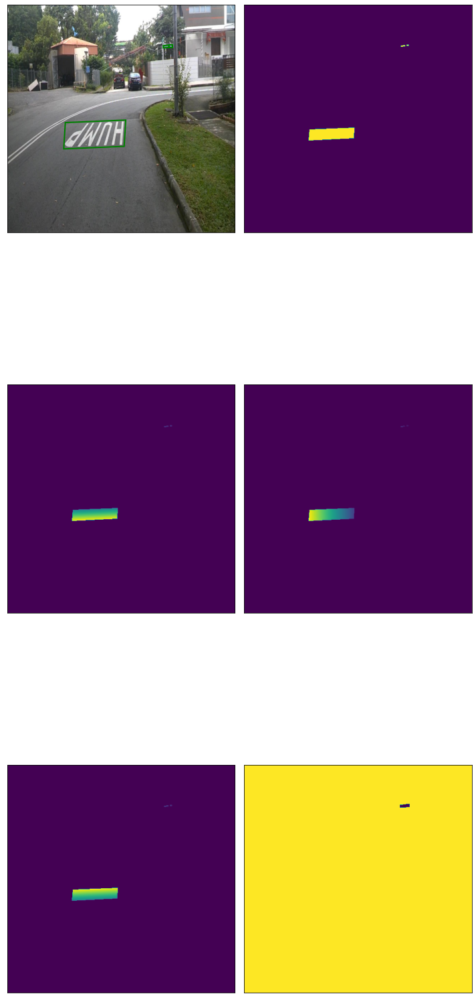

In [ ]:
  fig, axs = plt.subplots(3, 2, figsize=(10, 26))
  axs[0, 0].imshow(im[:, :, ::-1])
  axs[0, 0].set_xticks([])
  axs[0, 0].set_yticks([])
  for poly in text_polys:
    poly_h = min(abs(poly[3, 1] - poly[0, 1]), abs(poly[2, 1] - poly[1, 1]))
    poly_w = min(abs(poly[1, 0] - poly[0, 0]), abs(poly[2, 0] - poly[3, 0]))
    axs[0, 0].add_artist(Patches.Polygon(
      poly, facecolor='none', edgecolor='green', linewidth=2, linestyle='-', fill=True))
    #axs[0, 0].text(poly[0, 0], poly[0, 1], '{:.0f}-{:.0f}'.format(poly_h, poly_w), color='purple')
  axs[0, 1].imshow(score_map[::, ::])
  axs[0, 1].set_xticks([])
  axs[0, 1].set_yticks([])
  axs[1, 0].imshow(geo_map[::, ::, 0])
  axs[1, 0].set_xticks([])
  axs[1, 0].set_yticks([])
  axs[1, 1].imshow(geo_map[::, ::, 1])
  axs[1, 1].set_xticks([])
  axs[1, 1].set_yticks([])
  axs[2, 0].imshow(geo_map[::, ::, 2])
  axs[2, 0].set_xticks([])
  axs[2, 0].set_yticks([])
  axs[2, 1].imshow(training_mask[::, ::])
  axs[2, 1].set_xticks([])
  axs[2, 1].set_yticks([])
  plt.tight_layout()
  plt.show()
  plt.close()

In [ ]:
resnet = tf.keras.applications.ResNet50(input_shape=(512, 512, 3), weights='imagenet', include_top=False)
tf.keras.backend.clear_session()
x = resnet.get_layer('conv5_block3_out').output

x = tf.keras.layers.UpSampling2D(size=(2,2),interpolation='bilinear',data_format='channels_last',name='resize_1')(x)
x = tf.keras.layers.concatenate([x, resnet.get_layer('conv4_block6_out').output], axis=3)
x = tf.keras.layers.Conv2D(128, (1, 1), padding='same', kernel_regularizer=tf.keras.regularizers.l2(1e-5))(x)
x = tf.keras.layers.BatchNormalization(momentum=0.997, epsilon=1e-5, scale=True)(x)
x = tf.keras.layers.Activation('relu')(x)
x = tf.keras.layers.Conv2D(128, (3, 3), padding='same', kernel_regularizer=tf.keras.regularizers.l2(1e-5))(x)
x = tf.keras.layers.BatchNormalization(momentum=0.997, epsilon=1e-5, scale=True)(x)
x = tf.keras.layers.Activation('relu')(x)

x = tf.keras.layers.UpSampling2D(size=(2,2),interpolation='bilinear',data_format='channels_last',name='resize_2')(x)
x = tf.keras.layers.concatenate([x, resnet.get_layer('conv3_block4_out').output], axis=3)
x = tf.keras.layers.Conv2D(64, (1, 1), padding='same', kernel_regularizer=tf.keras.regularizers.l2(1e-5))(x)
x = tf.keras.layers.BatchNormalization(momentum=0.997, epsilon=1e-5, scale=True)(x)
x = tf.keras.layers.Activation('relu')(x)
x = tf.keras.layers.Conv2D(64, (3, 3), padding='same', kernel_regularizer=tf.keras.regularizers.l2(1e-5))(x)
x = tf.keras.layers.BatchNormalization(momentum=0.997, epsilon=1e-5, scale=True)(x)
x = tf.keras.layers.Activation('relu')(x)

x = tf.keras.layers.UpSampling2D(size=(2,2),interpolation='bilinear',data_format='channels_last',name='resize_3')(x)
x = tf.keras.layers.concatenate([x, resnet.get_layer('conv2_block3_out').output], axis=3)
x = tf.keras.layers.Conv2D(32, (1, 1), padding='same', kernel_regularizer=tf.keras.regularizers.l2(1e-5))(x)
x = tf.keras.layers.BatchNormalization(momentum=0.997, epsilon=1e-5, scale=True)(x)
x = tf.keras.layers.Activation('relu')(x)
x = tf.keras.layers.Conv2D(32, (3, 3), padding='same', kernel_regularizer=tf.keras.regularizers.l2(1e-5))(x)
x = tf.keras.layers.BatchNormalization(momentum=0.997, epsilon=1e-5, scale=True)(x)
x = tf.keras.layers.Activation('relu')(x)

x = tf.keras.layers.Conv2D(32, (3, 3), padding='same', kernel_regularizer=tf.keras.regularizers.l2(1e-5))(x)
x = tf.keras.layers.BatchNormalization(momentum=0.997, epsilon=1e-5, scale=True)(x)
x = tf.keras.layers.Activation('relu')(x)


pred_score_map = tf.keras.layers.Conv2D(1, (1, 1), activation=tf.nn.sigmoid, name='pred_score_map')(x)
rbox_geo_map = tf.keras.layers.Conv2D(4, (1, 1), activation=tf.nn.sigmoid, name='rbox_geo_map')(x)
angle_map = tf.keras.layers.Conv2D(1, (1, 1), activation=tf.nn.sigmoid, name='rbox_angle_map')(x)
angle_map = tf.keras.layers.Lambda(lambda x: (x - 0.5) * np.pi / 2)(angle_map)
output = tf.keras.layers.concatenate([pred_score_map,rbox_geo_map, angle_map], axis=3, name='pred_map')


model = tf.keras.models.Model(inputs=resnet.input, outputs= output,name='EAST')
for layers in resnet.layers:
  layers.trainable=False  

In [ ]:
model.summary()

Model: "EAST"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 512, 512, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 518, 518, 3)  0           input_2[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 256, 256, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 256, 256, 64) 256         conv1_conv[0][0]                 
_______________________________________________________________________________________________

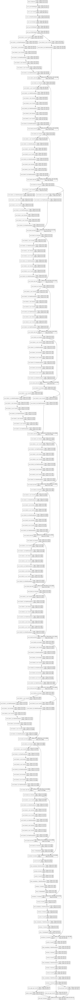

In [ ]:
tf.keras.utils.plot_model(model,show_shapes=True)

In [ ]:
# This is dice coefficient loss used to classify point as text and non text region 
def dice_coefficient(y_true_cls, y_pred_cls,training_mask):
    '''
    dice loss
    :param y_true_cls:
    :param y_pred_cls:
    :param training_mask:x
    :return:
    '''
    eps = 10**-6
    intersection = tf.reduce_sum(y_true_cls * y_pred_cls * training_mask)
    
    union = tf.reduce_sum(y_true_cls * training_mask) + tf.reduce_sum(y_pred_cls * training_mask) + eps
    loss = 1. - (2 * intersection / union)
    return loss

def rbox_loss(y_true_cls,y_true_geo,y_pred_geo,training_mask):
  # d1 -> top, d2->right, d3->bottom, d4->left
  d1_gt, d2_gt, d3_gt, d4_gt, theta_gt = tf.split(value=y_true_geo, num_or_size_splits=5, axis=3)
  d1_pred, d2_pred, d3_pred, d4_pred, theta_pred = tf.split(value=y_pred_geo, num_or_size_splits=5, axis=3)

  area_gt = (d1_gt + d3_gt) * (d2_gt + d4_gt)
  area_pred = (d1_pred + d3_pred) * (d2_pred + d4_pred)
  w_union = tf.minimum(d2_gt, d2_pred) + tf.minimum(d4_gt, d4_pred)
  h_union = tf.minimum(d1_gt, d1_pred) + tf.minimum(d3_gt, d3_pred)
  area_intersect = w_union * h_union
  area_union = area_gt + area_pred - area_intersect

  L_AABB = -tf.math.log((area_intersect + 1.0) / (area_union + 1.0))
  L_theta = 1 - tf.cos(theta_pred - theta_gt)

  L_g = L_AABB +  50*L_theta
  L_g=tf.squeeze(L_g,axis=3)

  return tf.reduce_mean(L_g * y_true_cls * training_mask)

In [ ]:
#This class contains complete loss we have used for text Detection Branch
class total_Loss(tf.keras.losses.Loss):
  def __init__(self, from_logits=False,reduction=tf.keras.losses.Reduction.AUTO,name='Loss_layer'):
      super(total_Loss, self).__init__(reduction=reduction, name=name)
  def call(self, y_true, y_pred):
    
    #Getting geo_map and score_maps
    y_true_cls=y_true[:,:,:,0]
    y_pred_cls=y_pred[:,:,:,0]
    y_pred_geo=y_pred[:,:,:,1:6]
    y_true_geo=y_true[:,:,:,1:6]
    training_mask=y_true[:,:,:,6]
    
    #1. Dice Loss
    dice_loss = dice_coefficient(y_true_cls, y_pred_cls, training_mask)
    # we scale classification loss by factor of 0.01 to match the iou loss part
    dice_loss *=0.01

    rbox_loss_ = rbox_loss(y_true_cls,y_true_geo,y_pred_geo,training_mask)
    
     
    return 100*(rbox_loss_ + dice_loss)




In [ ]:
#All Callbacks while training models
tensorboard=tf.keras.callbacks.TensorBoard(log_dir='detection',write_images=True,histogram_freq=1)
roplateau=tf.keras.callbacks.ReduceLROnPlateau(monitor='loss',factor=0.90,patience=2,mode='min')
early=tf.keras.callbacks.EarlyStopping(monitor='loss',patience=5,mode='min',verbose=1)
modelchk=tf.keras.callbacks.ModelCheckpoint('east_vgg.h5',save_best_only=True,mode='min',monitor='loss')

In [ ]:
model_vgg.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001,amsgrad=True),loss= total_Loss())

In [ ]:
history=model_vgg.fit(generator(batch_size=10),steps_per_epoch=100,epochs= 30,callbacks=[tensorboard,roplateau,modelchk,early])

Epoch 1/30
 14/100 [===>..........................] - ETA: 11:50 - loss: 3.6238

KeyboardInterrupt: ignored

In [ ]:
history=model_vgg.fit(generator(batch_size=10),steps_per_epoch=100,epochs= 30,callbacks=[tensorboard,roplateau,modelchk,early])

Epoch 1/30
100/100 [==============================] - 971s 9s/step - loss: 2.5674
Epoch 2/30
100/100 [==============================] - 435s 4s/step - loss: 1.7541
Epoch 3/30
100/100 [==============================] - 431s 4s/step - loss: 1.6343
Epoch 4/30
100/100 [==============================] - 428s 4s/step - loss: 1.5407
Epoch 5/30
100/100 [==============================] - 422s 4s/step - loss: 1.4535
Epoch 6/30
100/100 [==============================] - 415s 4s/step - loss: 1.3892
Epoch 7/30
100/100 [==============================] - 425s 4s/step - loss: 1.2165
Epoch 8/30
100/100 [==============================] - 417s 4s/step - loss: 1.0583
Epoch 9/30
100/100 [==============================] - 423s 4s/step - loss: 0.9696
Epoch 10/30
100/100 [==============================] - 426s 4s/step - loss: 0.9050
Epoch 11/30
100/100 [==============================] - 423s 4s/step - loss: 0.8327
Epoch 12/30
100/100 [==============================] - 422s 4s/step - loss: 0.8178
Epoch 13/30
1

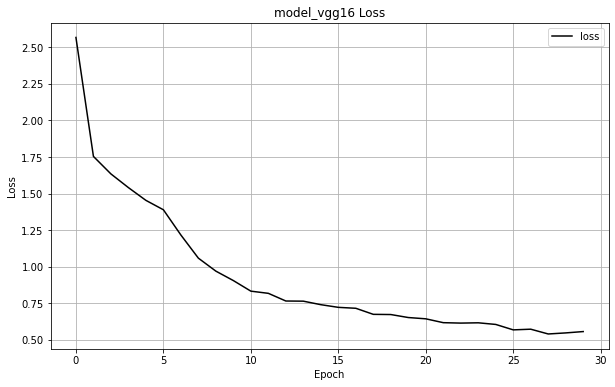

In [ ]:
plt.figure(figsize=(10,6))
plt.plot(history.history['loss'],color='black')
plt.title('model_vgg16 Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['loss'], loc='upper right')
plt.grid()
plt.savefig('modelvgg.png', dpi=480, bbox_inches='tight')
plt.show()

In [ ]:
tf.keras.models.save_model(model_vgg,'model_vgg1.h5')

In [ ]:
model_vgg.save_weights("model_vgg2.h5")

Model-2

In [ ]:
#All Callbacks while training models
tensorboard=tf.keras.callbacks.TensorBoard(log_dir='detection_resnet',write_images=True,histogram_freq=1)
modelchk=tf.keras.callbacks.ModelCheckpoint('east_resnet.h5',save_best_only=True,mode='min',monitor='loss')
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001,amsgrad=True),loss=total_Loss())
history_=model.fit(generator(batch_size=10),steps_per_epoch=100,epochs= 30,callbacks=[tensorboard,roplateau,modelchk,early])

Epoch 1/30
100/100 [==============================] - 639s 6s/step - loss: 2.2154
Epoch 2/30
100/100 [==============================] - 416s 4s/step - loss: 1.4700
Epoch 3/30
100/100 [==============================] - 417s 4s/step - loss: 1.3343
Epoch 4/30
100/100 [==============================] - 424s 4s/step - loss: 0.9764
Epoch 5/30
100/100 [==============================] - 410s 4s/step - loss: 0.8104
Epoch 6/30
100/100 [==============================] - 415s 4s/step - loss: 0.6971
Epoch 7/30
100/100 [==============================] - 412s 4s/step - loss: 0.6364
Epoch 8/30
100/100 [==============================] - 412s 4s/step - loss: 0.6320
Epoch 9/30
100/100 [==============================] - 413s 4s/step - loss: 0.5837
Epoch 10/30
100/100 [==============================] - 411s 4s/step - loss: 0.5623
Epoch 11/30
100/100 [==============================] - 410s 4s/step - loss: 0.5187
Epoch 12/30
100/100 [==============================] - 411s 4s/step - loss: 0.4981
Epoch 13/30
1

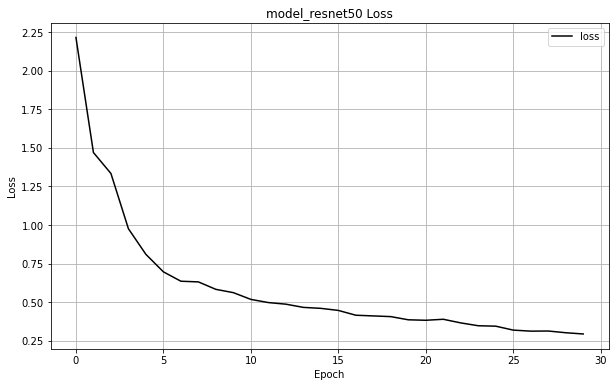

In [ ]:
plt.figure(figsize=(10,6))
plt.plot(history_.history['loss'],color='black')
plt.title('model_resnet50 Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['loss'], loc='upper right')
plt.grid()
plt.savefig('resnet50.png', dpi=480, bbox_inches='tight')
plt.show()

In [ ]:
tf.keras.models.save_model(model,'model_res.h5')

In [ ]:
model.save_weights("model_res1.h5")

In [ ]:
#These Are Function that will be used while converting geo_maps to score_maps and returns bounding boxes for image after nms

def sort_poly(p):
  min_axis = np.argmin(np.sum(p, axis=1))
  p = p[[min_axis, (min_axis+1)%4, (min_axis+2)%4, (min_axis+3)%4]]
  if abs(p[0, 0] - p[1, 0]) > abs(p[0, 1] - p[1, 1]):
    return p
  else:
    return p[[0, 3, 2, 1]]
def intersection(g, p):
    g = Polygon(g[:8].reshape((4, 2)))
    p = Polygon(p[:8].reshape((4, 2)))
    if not g.is_valid or not p.is_valid:
        return 0
    inter = Polygon(g).intersection(Polygon(p)).area
    union = g.area + p.area - inter
    if union == 0:
        return 0
    else:
        return inter/union


def weighted_merge(g, p):
    g[:8] = (g[8] * g[:8] + p[8] * p[:8])/(g[8] + p[8])
    g[8] = (g[8] + p[8])
    return g


def standard_nms(S, thres):
    order = np.argsort(S[:, 8])[::-1]
    keep = []
    while order.size > 0:
        i = order[0]
        keep.append(i)
        ovr = np.array([intersection(S[i], S[t]) for t in order[1:]])

        inds = np.where(ovr <= thres)[0]
        order = order[inds+1]

    return S[keep]


def nms_locality(polys, thres=0.3):
    '''
    :param polys: a N*9 numpy array. first 8 coordinates, then prob
    :return: boxes after nms
    '''
    S = []
    p = None
  
    for g in polys:
        if p is not None and intersection(g, p) > thres:
        
            p = weighted_merge(g, p)
        else:
            if p is not None:
                S.append(p)
            p = g
  
    if p is not None:
        S.append(p)

    if len(S) == 0:
        return np.array([])
    
    return standard_nms(np.array(S), thres)

In [ ]:
# Inference pipeline function used for generating predicted bounding boxes on image for text detection
def inferencePipeline(img,model):
  
  start_time=time.time()
  
  #1.Text Detection
  img=cv2.resize(img,(512,512))
  ii=model.predict(np.expand_dims(img,axis=0))
  score_map=ii[0][:,:,0]
  geo_map=ii[0][:,:,1:]
  print("Shape of Score Map",score_map.shape)
  print("Shape of Geo Map",geo_map.shape)

  for ind in [0,1,2,3,4]:
    geo_map[:,:,ind]*=score_map

  #2.ROI Rotate  
  score_map_thresh=0.5
  box_thresh=0.1 
  nms_thres=0.2
  if len(score_map.shape) == 4:
    score_map = score_map[0, :, :, 0]
    geo_map = geo_map[0, :, :, :]

  # filter the score map
  xy_text = np.argwhere(score_map > score_map_thresh)

  # sort the text boxes via the y axis
  xy_text = xy_text[np.argsort(xy_text[:, 0])]

  # restore
  text_box_restored = restore_rectangle(xy_text[:, ::-1], geo_map[xy_text[:, 0], xy_text[:, 1], :]) # N*4*2
  boxes = np.zeros((text_box_restored.shape[0], 9), dtype=np.float32)
  boxes[:, :8] = text_box_restored.reshape((-1, 8))
  boxes[:, 8] = score_map[xy_text[:, 0], xy_text[:, 1]]
  print("Boxes Shape",boxes.shape)
  boxes = nms_locality(boxes.astype(np.float64), nms_thres)

  
  # here we filter some low score boxes by the average score map, this is different from the orginal paper
  for i, box in enumerate(boxes):
    mask = np.zeros_like(score_map, dtype=np.uint8)
    cv2.fillPoly(mask, box[:8].reshape((-1, 4, 2)).astype(np.int32), 1)
    boxes[i, 8] = cv2.mean(score_map, mask)[0]
  
    if i==4:
      break
  if len(boxes)>0:
    boxes = boxes[boxes[:, 8] > box_thresh]
  boxes[:,:8:2] = np.clip(boxes[:,:8:2], 0, 512 - 1)
  boxes[:,1:8:2] = np.clip(boxes[:,1:8:2], 0, 512 - 1)  
  res = []
  result = []
  if len(boxes)>0:

    for box in boxes:
      box_ =  box[:8].reshape((4, 2))
      if np.linalg.norm(box_[0] - box_[1]) < 8 or np.linalg.norm(box_[3]-box_[0]) < 8:
        continue
      result.append(box_)
  res.append(np.array(result, np.float32))   

  box_index = []
  brotateParas = []
  filter_bsharedFeatures = []
  for i in range(len(res)):
    rotateParas = []
    rboxes=res[i]
    txt=[]
    for j, rbox in enumerate(rboxes):
      para = restore_roiRotatePara(rbox)
      if para and min(para[1][2:]) > 8:
        rotateParas.append(para)
        box_index.append((i, j))
    pts=[]   
    
    
    #3. Text Recognition (From boxes given by Text Detection+ROI Rotate) 
    
  if len(rotateParas) > 0:
      
      for num in range(len(rotateParas)):
        text=""
        out=rotateParas[num][0]
        crop=rotateParas[num][1]
        points=np.array([[out[0],out[1]],[out[0]+out[2],out[1]],[out[0]+out[2],out[1]+out[3]],[out[0],out[1]+out[3]]])
        pts.append(points)
    
    # 4. Labeling detected and Recognized Text in Image
    
  for i in range(len(pts)):
      cv2.polylines(img,[pts[i]],isClosed=True,color=(0,255,0),thickness=2)
      #cv2.putText(img,txt[i],(pts[i][0][0],pts[i][0][1]),cv2.FONT_HERSHEY_SIMPLEX,0.8, (0, 255, 0), 3)
  end_time=time.time()
  print("Time Taken By Pipeline="+str(end_time-start_time)+" seconds") 
  return img   


In [ ]:
from keras.models import load_model
model_1 = load_model('east_vgg.h5', custom_objects={'total_Loss': total_Loss()})
model_2 = load_model('east_resnet.h5', custom_objects={'total_Loss': total_Loss()})

In [ ]:
def bounding_box(img_array,df_txt,df_co):

  txt=np.array(df_txt)

  v = []
  for i in df_co:
    v.append(list(map(int,i)))

  b=np.array(v)
  (r, c) = b.shape

  for y in range(0, r):
    for x in range(0, c):
      rec_pts = np.array([[b[y,0],b[y,1]],[b[y,2],b[y,3]],[b[y,4],b[y,5]],[b[y,6],b[y,7]]], np.int32) ## taking the co ordinates of rectangle
      #rec_pts = pts.reshape((-1,1,2))
      img = cv2.polylines(img_array,[rec_pts],True,(0,255,255),thickness =2) ## used to draw bounding box on the image
      
      (text_width, text_height) = cv2.getTextSize(txt[y], cv2.FONT_HERSHEY_PLAIN, 1.5, 1)[0] ## taking width and height of the image
      # set the text start position
      text_offset_x = b[y,0] 
      text_offset_y = b[y,1] + 2
      # make the coords of the box with a small padding of two pixels
      box_coords = ((text_offset_x, text_offset_y), (text_offset_x + text_width + 2, text_offset_y - text_height - 2))
      #cv2.rectangle(img, box_coords[0], box_coords[1], (255, 255, 255), cv2.FILLED)
      #cv2.putText(img, txt[y], (text_offset_x, text_offset_y), cv2.FONT_HERSHEY_PLAIN, 1.5, (0, 0, 0), 1) ## put the text on the image
  plt.grid(False)      
  plt.imshow(img)

### For Model-1

Shape of Score Map (512, 512)
Shape of Geo Map (512, 512, 5)
Boxes Shape (463, 9)
Time Taken By Pipeline=0.18818092346191406 seconds
Shape of Score Map (512, 512)
Shape of Geo Map (512, 512, 5)
Boxes Shape (1244, 9)
Time Taken By Pipeline=0.355419397354126 seconds
Shape of Score Map (512, 512)
Shape of Geo Map (512, 512, 5)
Boxes Shape (2641, 9)
Time Taken By Pipeline=0.6848068237304688 seconds
Shape of Score Map (512, 512)
Shape of Geo Map (512, 512, 5)
Boxes Shape (880, 9)
Time Taken By Pipeline=0.25556254386901855 seconds
Shape of Score Map (512, 512)
Shape of Geo Map (512, 512, 5)
Boxes Shape (866, 9)
Time Taken By Pipeline=0.2498154640197754 seconds


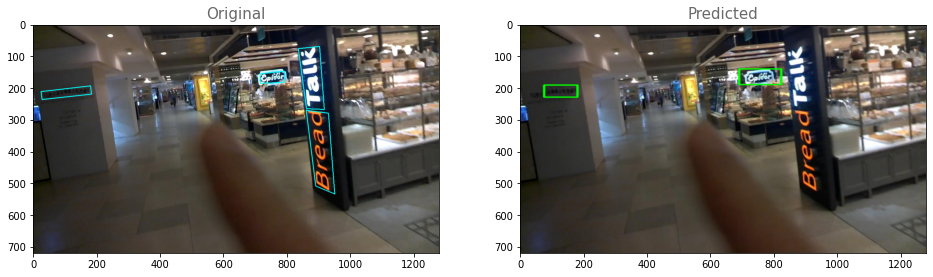

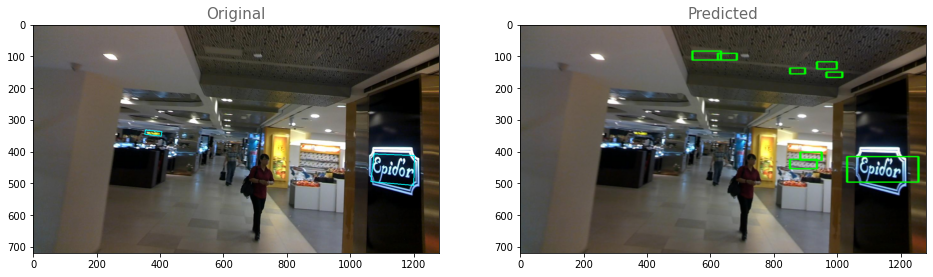

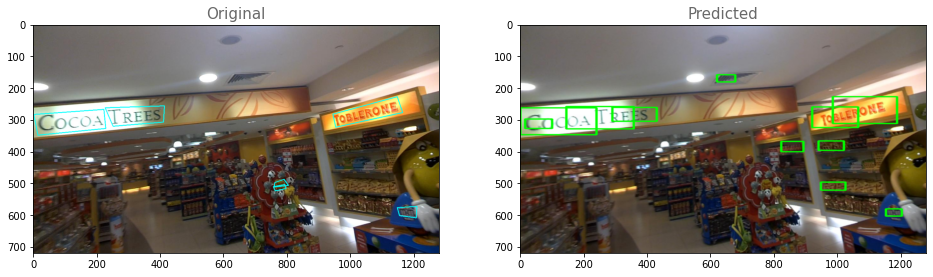

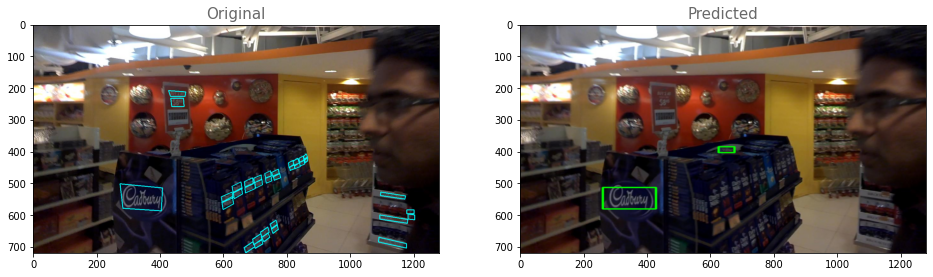

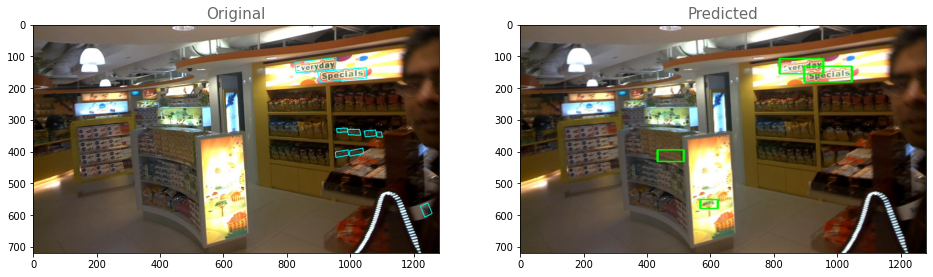

In [ ]:
for i in range(90,95):
  # Reading image from folder where it is stored 
  filepath = df_test['path_img'][i]
  txt_p = df_test['texts'][i]
  co_d = df_test['co-ordinates'][i]
  img = cv2.imread(filepath)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  img_= img.copy()
  img=cv2.resize(img,(512,512))
  
  

  im=inferencePipeline(img,model_1)
  im =cv2.resize(im,(1280,720))
  plt.figure(figsize=(16,6))
  # Plotting of source and destination image 
  plt.subplot(121),plt.title('Original',fontsize=15,color='dimgrey'), bounding_box(img_,txt_p,co_d)
  plt.subplot(122),plt.title('Predicted',fontsize =15,color='dimgrey'), plt.imshow(im) 
  plt.savefig('plot_int'+str(i)+'.png', dpi=300, bbox_inches='tight')


### For Model_2

Cause: could not parse the source code of <function <lambda> at 0x7f8a1632b3b0>: no matching AST found
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Cause: could not parse the source code of <function <lambda> at 0x7f8a1632b3b0>: no matching AST found
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Cause: could not parse the source code of <function <lambda> at 0x7f8a1632b170>: no matching AST found
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Cause: could not parse the source code of <function <lambda> at 0x7f8a1632b170>: no matching AST found
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Shape of Score Map (512, 512)
Shape of Geo Map (512, 512, 5)
Boxes Shape (496, 9)
Time Taken By Pipeline=5.790935277938843 seconds
Shape of Score Map (512, 512)
Shape of Geo Map (512, 512, 5)
Boxes Shape (558, 9)

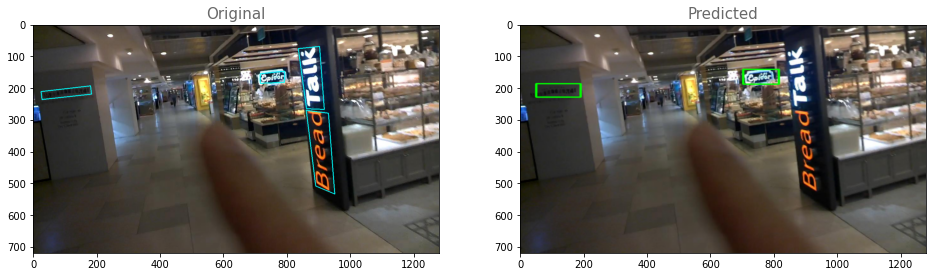

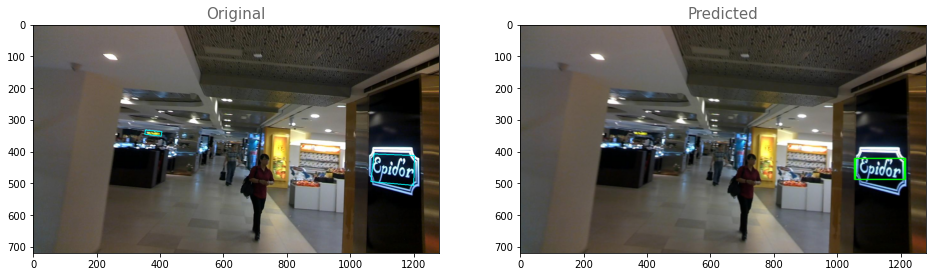

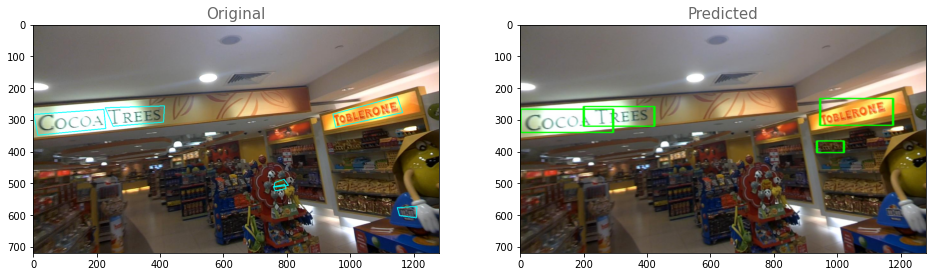

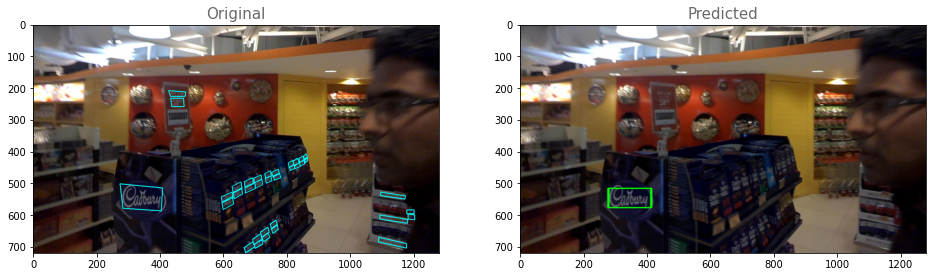

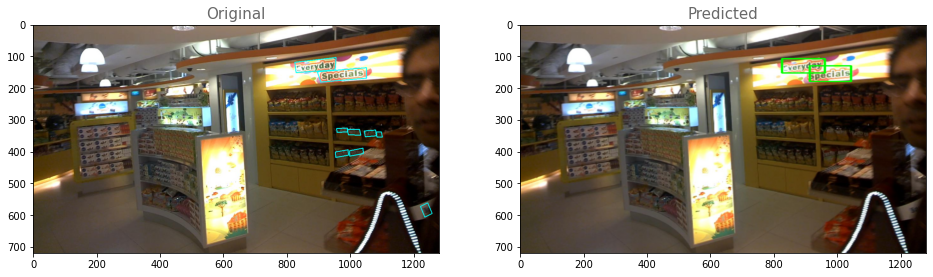

In [ ]:
for i in range(90,95):
  # Reading image from folder where it is stored 
  filepath = df_test['path_img'][i]
  txt_p = df_test['texts'][i]
  co_d = df_test['co-ordinates'][i]
  img = cv2.imread(filepath)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  img_= img.copy()
  img=cv2.resize(img,(512,512))
  
  

  im=inferencePipeline(img,model_2)
  im =cv2.resize(im,(1280,720))
  plt.figure(figsize=(16,6))
  # Plotting of source and destination image 
  plt.subplot(121),plt.title('Original',fontsize=15,color='dimgrey'), bounding_box(img_,txt_p,co_d)
  plt.subplot(122),plt.title('Predicted',fontsize =15,color='dimgrey'), plt.imshow(im) 
  plt.savefig('plot_int_2'+str(i)+'.png', dpi=300, bbox_inches='tight')


### Final Pipeline[Dtection(EAST) + Recognition(Tesseract)]

In [ ]:
import pytesseract
from spellchecker import SpellChecker
def final(img, model):
  spell = SpellChecker()
  #Configuration setting to convert image to string.  
  configuration = ("-l eng --oem 3 --psm 12")
  img = cv2.imread(filepath) 

  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  #1.Text Detection
  img=cv2.resize(img,(512,512))
  ii=model.predict(np.expand_dims(img,axis=0))
  score_map=ii[0][:,:,0]
  geo_map=ii[0][:,:,1:]
  print("Shape of Score Map",score_map.shape)
  print("Shape of Geo Map",geo_map.shape)

  for ind in [0,1,2,3,4]:
    geo_map[:,:,ind]*=score_map

  #2.ROI Rotate  
  score_map_thresh=0.5
  box_thresh=0.1 
  nms_thres=0.2
  if len(score_map.shape) == 4:
    score_map = score_map[0, :, :, 0]
    geo_map = geo_map[0, :, :, :]

  # filter the score map
  xy_text = np.argwhere(score_map > score_map_thresh)

  # sort the text boxes via the y axis
  xy_text = xy_text[np.argsort(xy_text[:, 0])]

  # restore
  text_box_restored = restore_rectangle(xy_text[:, ::-1], geo_map[xy_text[:, 0], xy_text[:, 1], :]) # N*4*2
  boxes = np.zeros((text_box_restored.shape[0], 9), dtype=np.float32)
  boxes[:, :8] = text_box_restored.reshape((-1, 8))
  boxes[:, 8] = score_map[xy_text[:, 0], xy_text[:, 1]]
  print("Boxes Shape",boxes.shape)
  boxes = nms_locality(boxes.astype(np.float64), nms_thres)


  # here we filter some low score boxes by the average score map, this is different from the orginal paper
  for i, box in enumerate(boxes):
    mask = np.zeros_like(score_map, dtype=np.uint8)
    cv2.fillPoly(mask, box[:8].reshape((-1, 4, 2)).astype(np.int32), 1)
    boxes[i, 8] = cv2.mean(score_map, mask)[0]

    if i==4:
      break
  if len(boxes)>0:
    boxes = boxes[boxes[:, 8] > box_thresh]
  boxes[:,:8:2] = np.clip(boxes[:,:8:2], 0, 512 - 1)
  boxes[:,1:8:2] = np.clip(boxes[:,1:8:2], 0, 512 - 1)  
  res = []
  result = []
  if len(boxes)>0:

    for box in boxes:
      box_ =  box[:8].reshape((4, 2))
      if np.linalg.norm(box_[0] - box_[1]) < 8 or np.linalg.norm(box_[3]-box_[0]) < 8:
        continue
      result.append(box_)
  res.append(np.array(result, np.float32))   

  box_index = []
  brotateParas = []
  filter_bsharedFeatures = []
  for i in range(len(res)):
    rotateParas = []
    rboxes=res[i]
    txt=[]
    for j, rbox in enumerate(rboxes):
      para = restore_roiRotatePara(rbox)
      if para and min(para[1][2:]) > 8:
        rotateParas.append(para)
        box_index.append((i, j))
    pts=[]   
    
    
    #3. Text Recognition (From boxes given by Text Detection+ROI Rotate) 
  txt = [] 
  if len(rotateParas) > 0:
      for num in range(len(rotateParas)):
        text=""
        out=rotateParas[num][0]
        crop=rotateParas[num][1]
        points=np.array([[out[0],out[1]],[out[0]+out[2],out[1]],[out[0]+out[2],out[1]+out[3]],[out[0],out[1]+out[3]]])
        angle=rotateParas[num][2] 
        img1=tf.image.crop_to_bounding_box(img,out[1],out[0],out[3],out[2])
        img2=tf.keras.preprocessing.image.random_rotation(img1,angle)
        img2=tf.image.crop_to_bounding_box(img2,crop[1],crop[0],crop[3],crop[2]).numpy()
        img2=cv2.resize(img2,(128,64))
        img2=cv2.detailEnhance(img2)
        plt.show()
        text = pytesseract.image_to_string(img2, config=configuration).strip()
        strn = spell.correction(text)
        strn = re.sub(r"\n", " ",strn)
        strn = re.sub(r"\t", " ", strn)
        strn = re.sub(r'[?|$|.|!]',r'',strn)
        strn = re.sub(r'[^a-zA-Z0-9 ]',r'',strn)
        txt.append(strn)
  
        pts.append(points)

  for i in range(len(txt)):
    cv2.polylines(img,[pts[i]],isClosed=True,color=(255,255,0),thickness=2)
   # cv2.putText(img,txt[i],(pts[i][0][0],pts[i][0][1]),cv2.FONT_HERSHEY_SIMPLEX,0.8, (0, 0, 255), 3)

  return img,txt


In [ ]:
for i in range(100,105):
  # Reading image from folder where it is stored 
  filepath = df_test['path_img'][i]
  txt_ = df_test['texts'][i]
  co_d = df_test['co-ordinates'][i]

  img = cv2.imread(filepath)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  img_= img.copy()
  img=cv2.resize(img,(512,512))
  
  im,txt= final(img,model_2)
  print("Actual Texts:",txt_)
  print("Predicted texts:",txt)
  plt.figure(figsize=(16,6))
  # Plotting of source and destination image 
  plt.subplot(121),plt.title('Original',fontsize=15,color='dimgrey'), bounding_box(img_,txt_,co_d)
  plt.subplot(122),plt.title('Predicted',fontsize =15,color='dimgrey'), plt.imshow(im) 
  plt.show()
  print("="*100)
  

### Calculating losses for each images

In [ ]:
def loss(df):
  loss_list = []
  for i in range(len(df)):
    print(i)


    input_size=512
    filepath = df['path_img'][i]
    gt_file = df['path_gt'][i]

    if filepath =='Data/ICDAR_15/train/img_141.jpg' and gt_file == 'Data/ICDAR_15/train_gt/gt_img_141.txt':
      loss = np.array(0.0)
      loss_list.append(loss)
    else:

      img_p = cv2.imread(filepath) 
      img_p = cv2.resize(img_p,(512,512))
      ii = model.predict(np.expand_dims(img_p,axis=0))
      y_pred_cls = ii[0][:,:,0]
      y_pred_geo = ii[0][:,:,1:]

      im = cv2.imread(filepath,cv2.IMREAD_UNCHANGED)

      # print im_fn
      h, w, _ = im.shape
      # txt_fn = im_fn
      text_polys, text_tags = load_annoataion(gt_file)
      text_polys, text_tags = check_and_validate_polys(text_polys, text_tags, (h, w))


      #resize the image to input size
      new_h, new_w, _ = im.shape
      resize_h = input_size
      resize_w = input_size
      im = cv2.resize(im, dsize=(512, 512),interpolation = cv2.INTER_AREA)


      resize_ratio_3_x = resize_w/float(new_w)
      resize_ratio_3_y = resize_h/float(new_h)
      text_polys[:, :, 0] *= resize_ratio_3_x
      text_polys[:, :, 1] *= resize_ratio_3_y
      new_h, new_w, _ = im.shape
      y_true_cls, y_true_geo, training_mask, rbox, text_tags, recg_mask = generate_rbox((new_h, new_w), text_polys, text_tags)

      dice_loss = dice_coefficient(y_true_cls, y_pred_cls, training_mask)
      # we scale classification loss by factor of 0.01 to match the iou loss part
      dice_loss =0.01*dice_loss

      rbox_loss_ = rbox_loss(y_true_cls,y_true_geo,y_pred_geo,training_mask)

      loss = 100*(rbox_loss_ + dice_loss).numpy()
      loss_list.append(loss)
  return loss_list


In [ ]:
df_train['loss'] = loss(df_train)
df_train.to_pickle('final_train.pkl')

In [ ]:
df_test['loss'] = loss(df_test)
df_test.to_pickle('final_test.pkl')

In [1]:
import os
import time
from os.path import exists, join, basename, splitext

git_repo_url = 'https://github.com/mozilla/TTS.git'
project_name = splitext(basename(git_repo_url))[0]
if not exists(project_name):
  !git clone -q {git_repo_url}
  !cd {project_name} && git checkout Tacotron2-iter-260K-824c091
  !pip install -q gdown lws librosa Unidecode==0.4.20 tensorboardX git+git://github.com/bootphon/phonemizer@master localimport
  !apt-get install -y espeak
git_repo_url = 'https://github.com/erogol/WaveRNN.git'
project_name = splitext(basename(git_repo_url))[0]
if not exists(project_name):
  !git clone -q {git_repo_url}
  !cd {project_name} && git checkout 8a1c152 && pip install -q -r requirements.txt

  
import sys
sys.path.append('TTS')
sys.path.append('WaveRNN')
from localimport import localimport
  
from IPython.display import Audio, display

Branch 'Tacotron2-iter-260K-824c091' set up to track remote branch 'Tacotron2-iter-260K-824c091' from 'origin'.
Switched to a new branch 'Tacotron2-iter-260K-824c091'
     |████████████████████████████████| 150 kB 5.3 MB/s 
     |████████████████████████████████| 228 kB 35.6 MB/s 
     |████████████████████████████████| 124 kB 47.9 MB/s 
     |████████████████████████████████| 195 kB 39.6 MB/s 
     |████████████████████████████████| 45 kB 3.2 MB/s 
Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following additional packages will be installed:
  espeak-data libespeak1 libportaudio2 libsonic0
The following NEW packages will be installed:
  espeak espeak-data libespeak1 libportaudio2 libsonic0
0 upgraded, 5 newly installed, 0 to remove and 37 not upgraded.
Need to get 1,219 kB of archives.
After this operation, 3,031 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 libportaudio2 amd

In [2]:
# WaveRNN
!mkdir -p wavernn_models tts_models
wavernn_pretrained_model = 'wavernn_models/checkpoint_433000.pth.tar'
if not exists(wavernn_pretrained_model):
  !gdown -O {wavernn_pretrained_model} https://drive.google.com/uc?id=12GRFk5mcTDXqAdO5mR81E-DpTk8v2YS9
wavernn_pretrained_model_config = 'wavernn_models/config.json'
if not exists(wavernn_pretrained_model_config):
  !gdown -O {wavernn_pretrained_model_config} https://drive.google.com/uc?id=1kiAGjq83wM3POG736GoyWOOcqwXhBulv
    
# TTS
tts_pretrained_model = 'tts_models/checkpoint_261000.pth.tar'
if not exists(tts_pretrained_model):
  !gdown -O {tts_pretrained_model} https://drive.google.com/uc?id=1otOqpixEsHf7SbOZIcttv3O7pG0EadDx
tts_pretrained_model_config = 'tts_models/config.json'
if not exists(tts_pretrained_model_config):
  !gdown -O {tts_pretrained_model_config} https://drive.google.com/uc?id=1IJaGo0BdMQjbnCcOL4fPOieOEWMOsXE-

Downloading...
From: https://drive.google.com/uc?id=12GRFk5mcTDXqAdO5mR81E-DpTk8v2YS9
To: /content/wavernn_models/checkpoint_433000.pth.tar
100% 50.9M/50.9M [00:00<00:00, 82.7MB/s]
Downloading...
From: https://drive.google.com/uc?id=1kiAGjq83wM3POG736GoyWOOcqwXhBulv
To: /content/wavernn_models/config.json
100% 2.31k/2.31k [00:00<00:00, 4.01MB/s]
Downloading...
From: https://drive.google.com/uc?id=1otOqpixEsHf7SbOZIcttv3O7pG0EadDx
To: /content/tts_models/checkpoint_261000.pth.tar
100% 338M/338M [00:02<00:00, 126MB/s]
Downloading...
From: https://drive.google.com/uc?id=1IJaGo0BdMQjbnCcOL4fPOieOEWMOsXE-
To: /content/tts_models/config.json
100% 5.75k/5.75k [00:00<00:00, 17.2MB/s]


In [3]:
import io
import torch 
import time
import numpy as np
from collections import OrderedDict
from matplotlib import pylab as plt
import IPython

%pylab inline
rcParams["figure.figsize"] = (16,5)

import librosa
import librosa.display

from TTS.models.tacotron import Tacotron 
from TTS.layers import *
from TTS.utils.data import *
from TTS.utils.audio import AudioProcessor
from TTS.utils.generic_utils import load_config, setup_model
from TTS.utils.text import text_to_sequence
from TTS.utils.synthesis import synthesis
from TTS.utils.visual import visualize

def tts(model, text, CONFIG, use_cuda, ap, use_gl, speaker_id=None, figures=True):
    t_1 = time.time()
    waveform, alignment, mel_spec, mel_postnet_spec, stop_tokens = synthesis(model, text, CONFIG, use_cuda, ap, truncated=True, enable_eos_bos_chars=CONFIG.enable_eos_bos_chars)
    if CONFIG.model == "Tacotron" and not use_gl:
        mel_postnet_spec = ap.out_linear_to_mel(mel_postnet_spec.T).T
    if not use_gl:
        waveform = wavernn.generate(torch.FloatTensor(mel_postnet_spec.T).unsqueeze(0).cuda(), batched=batched_wavernn, target=11000, overlap=550)

    print(" >  Run-time: {}".format(time.time() - t_1))
    if figures:                                                                                                         
        visualize(alignment, mel_postnet_spec, stop_tokens, text, ap.hop_length, CONFIG, mel_spec)                                                                       
    IPython.display.display(Audio(waveform, rate=CONFIG.audio['sample_rate']))  
    #os.makedirs(OUT_FOLDER, exist_ok=True)
    #file_name = text.replace(" ", "_").replace(".","") + ".wav"
    #out_path = os.path.join(OUT_FOLDER, file_name)
    #ap.save_wav(waveform, out_path)
    return alignment, mel_postnet_spec, stop_tokens, waveform
  
use_cuda = True
batched_wavernn = True

# initialize TTS
CONFIG = load_config(tts_pretrained_model_config)
from TTS.utils.text.symbols import symbols, phonemes
# load the model
num_chars = len(phonemes) if CONFIG.use_phonemes else len(symbols)
model = setup_model(num_chars, CONFIG)
# load the audio processor
ap = AudioProcessor(**CONFIG.audio)         
# load model state
if use_cuda:
    cp = torch.load(tts_pretrained_model)
else:
    cp = torch.load(tts_pretrained_model, map_location=lambda storage, loc: storage)

# load the model
model.load_state_dict(cp['model'])
if use_cuda:
    model.cuda()
model.eval()
print(cp['step'])
model.decoder.max_decoder_steps = 2000

# initialize WaveRNN
VOCODER_CONFIG = load_config(wavernn_pretrained_model_config)
with localimport('/content/WaveRNN') as _importer:
  from models.wavernn import Model
bits = 10

wavernn = Model(
        rnn_dims=512,
        fc_dims=512,
        mode="mold",
        pad=2,
        upsample_factors=VOCODER_CONFIG.upsample_factors,  # set this depending on dataset
        feat_dims=VOCODER_CONFIG.audio["num_mels"],
        compute_dims=128,
        res_out_dims=128,
        res_blocks=10,
        hop_length=ap.hop_length,
        sample_rate=ap.sample_rate,
    ).cuda()
check = torch.load(wavernn_pretrained_model)
wavernn.load_state_dict(check['model'])
if use_cuda:
    wavernn.cuda()
wavernn.eval()
print(check['step'])

Populating the interactive namespace from numpy and matplotlib


/usr/local/lib/python3.7/dist-packages/IPython/core/magics/pylab.py:161: UserWarning: pylab import has clobbered these variables: ['plt']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


 > Using model: Tacotron2
 > Setting up Audio Processor...
 | > bits:None
 | > sample_rate:22050
 | > num_mels:80
 | > min_level_db:-100
 | > frame_shift_ms:12.5
 | > frame_length_ms:50
 | > ref_level_db:20
 | > num_freq:1025
 | > power:1.5
 | > preemphasis:0.98
 | > griffin_lim_iters:60
 | > signal_norm:True
 | > symmetric_norm:False
 | > mel_fmin:0.0
 | > mel_fmax:8000.0
 | > max_norm:1.0
 | > clip_norm:True
 | > do_trim_silence:True
 | > n_fft:2048
 | > hop_length:275
 | > win_length:1102
261000
433000


In [7]:
SENTENCE = 'Hello everyone ,Welocome to Walchand!.'

In [8]:
align, spec, stop_tokens, wav = tts(model, SENTENCE, CONFIG, use_cuda, ap, speaker_id=0, use_gl=False, figures=False)

72000/72600 -- batch_size: 6 -- gen_rate: 4.0 kHz -- x_realtime: 0.2   >  Run-time: 22.42087197303772
